# Mask R-CNN - Inspect Gland Training/Validating Data

Inspect and visualize data loading and pre-processing code.

In [2]:
import os
import sys
import itertools
import math
import logging
import json
import re
import random
from collections import OrderedDict
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon
import shutil

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

from samples.gland import gland_data

%matplotlib inline 

## Configurations

Configurations are defined in gland_data.py

In [15]:
config = gland_data.GlandConfig()
config.BACKBONE = "resnet50"
# config.BACKBONE_STRIDES = [32/3, 4, 8/3, 8/3, 4]
# config.RPN_ANCHOR_SCALES = (96, 256, 384, 384, 256)

config.IMAGE_MAX_DIM = 1024
config.MINI_MASK_SHAPE = (56, 56)
config.display()
# BALLOON_DIR = os.path.join(ROOT_DIR, "datasets/balloon")
DATASET_DIR = '/home/mkubita/Pulpit/projektBadawczy/Dataset_Model/'
OLD_DATASET_DIR = '/home/mkubita/Pulpit/projektBadawczy/Dataset/'


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE          

## Dataset

In [4]:
print(DATASET_DIR)

/home/mkubita/Pulpit/projektBadawczy/Dataset_Model/


In [4]:
# prepare dataset for training and validation
# train_files, val_files = list(), list()
# not_processed_files = [11, 14, 24, 42]

# with open('/home/mkubita/Pulpit/projektBadawczy/via_region_data2.json', 'r') as file:
#     json_ = json.load(file)

# def split_data(json_, training_samples_percent, not_processed_files):
#     files = list(json_['_via_img_metadata'].keys())
#     number_processed_files = len(files) - len(not_processed_files)
#     training_number = int(training_samples_percent * number_processed_files)
    
#     for file in files:
#         index = int(file.replace('train_','').split('.')[0])
#         if index not in not_processed_files:
#             if len(train_files) < training_number:
#                 train_files.append(file)
#             else:
#                 val_files.append(file)
#     return train_files, val_files

# train_files, val_files = split_data(json_, 0.8, not_processed_files)

# len(train_files), len(val_files)

In [108]:
# prepare dataset for training and validation

train_files, val_files = list(), list()
not_processed_files = [11, 14, 24, 42]

with open('/home/mkubita/Pulpit/projektBadawczy/adnotacje/via_region_data2.json', 'r') as file:
    json_train = json.load(file)
    
with open('/home/mkubita/Pulpit/projektBadawczy/adnotacje/test.json', 'r') as file:
    json_test = json.load(file)
    
def prepare_train_data(json_, not_processed_files):
    files = list(json_['_via_img_metadata'].keys())
    number_processed_files = len(files) - len(not_processed_files)
    
    for file in files:
        index = int(file.replace('train_','').split('.')[0])
        if index not in not_processed_files:
            train_files.append(file)
    return train_files

def prepare_test_dataA(json_):
    files = list(json_['_via_img_metadata'].keys())
    number_processed_files = len(files)
    
    for file in files:
        try:
            index = int(file.replace('testA_','').split('.')[0])
            if index not in not_processed_files:
                val_files.append(file)
        except:
            pass
    return val_files

train_files = prepare_train_data(json_train, not_processed_files)
val_files = prepare_test_dataA(json_test)

len(train_files), len(val_files)

(81, 56)

In [109]:
def prepare_test_dataB(json_):
    val_files = list()
    files = list(json_['_via_img_metadata'].keys())
    number_processed_files = len(files)
    
    for file in files:
        try:
            index = int(file.replace('testB_','').split('.')[0])
            val_files.append(file)
        except:
            pass
    return val_files

with open('/home/mkubita/Pulpit/projektBadawczy/adnotacje/test.json', 'r') as file:
    json_test = json.load(file)

    
val_files2 = prepare_test_dataB(json_test)
print(val_files2)

['testB_1.bmp1215270', 'testB_2.bmp1215270', 'testB_3.bmp1215270', 'testB_4.bmp1215270', 'testB_5.bmp1215270', 'testB_6.bmp1215270', 'testB_7.bmp1215270', 'testB_8.bmp1215270', 'testB_9.bmp1215270', 'testB_10.bmp1215270', 'testB_11.bmp1215270', 'testB_12.bmp1215270', 'testB_13.bmp1215270', 'testB_14.bmp1215270', 'testB_15.bmp1215270', 'testB_16.bmp1215270', 'testB_17.bmp1215270', 'testB_18.bmp1215270', 'testB_19.bmp1215270', 'testB_20.bmp1215270']


In [19]:
# Copy files and annotations for training/validation
via_region_json_train, via_region_json_val = {}, {}


# for file in train_files:
#     via_region_json_train[file] = json_train['_via_img_metadata'][file]
#     shutil.copyfile(os.path.join(OLD_DATASET, json_train['_via_img_metadata'][file]['filename']), os.path.join('/home/mkubita/Pulpit/projektBadawczy/Dataset_Model/train', json_train['_via_img_metadata'][file]['filename']))
# with open("/home/mkubita/Pulpit/projektBadawczy/Dataset_Model/train/via_region_data.json", "w") as outfile:
#     outfile.write(json.dumps(via_region_json_train))
    
# for file in val_files2:
#     via_region_json_val[file] = json_test['_via_img_metadata'][file]
#     shutil.copyfile(os.path.join(OLD_DATASET_DIR, json_test['_via_img_metadata'][file]['filename']), os.path.join('/home/mkubita/Pulpit/projektBadawczy/Dataset_Model/val2', json_test['_via_img_metadata'][file]['filename']))
# with open("/home/mkubita/Pulpit/projektBadawczy/Dataset_Model/val2/via_region_data.json", "w") as outfile:
#     outfile.write(json.dumps(via_region_json_val))


In [5]:
# Load dataset
# Get the dataset from the releases page
# https://github.com/matterport/Mask_RCNN/releases
dataset = gland_data.GlandDataset()
dataset.load_gland(DATASET_DIR, "train")

# Must call before using the dataset
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 81
Class Count: 2
  0. BG                                                
  1. gland                                             


In [18]:
def display_top_masks(image, mask, class_ids, class_names, limit=4):
    """Display the given image and the top few class masks."""
    to_display = []
    titles = []
    to_display.append(image)
    titles.append("H x W={}x{}".format(image.shape[0], image.shape[1]))
    # Pick top prominent classes in this image
    unique_class_ids = np.unique(class_ids)
    mask_area = [np.sum(mask[:, :, np.where(class_ids == i)[0]])
                 for i in unique_class_ids]
    top_ids = [v[0] for v in sorted(zip(unique_class_ids, mask_area),
                                    key=lambda r: r[1], reverse=True) if v[1] > 0]
    # Generate images and titles
    for i in range(limit):
        class_id = top_ids[i] if i < len(top_ids) else -1
        # Pull masks of instances belonging to the same class.
        m = mask[:, :, np.where(class_ids == class_id)[0]]
        m = np.sum(m * np.arange(1, m.shape[-1] + 1), -1)
        to_display.append(m)
        titles.append(class_names[class_id] if class_id != -1 else "-")
    display_images(to_display, titles=titles, cols=limit + 1, cmap="Blues_r")

def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Display Samples

Load and display images and masks.

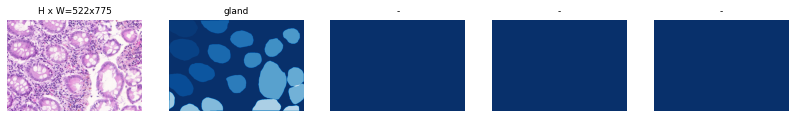

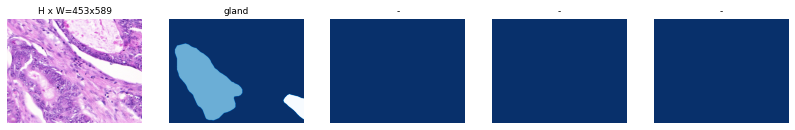

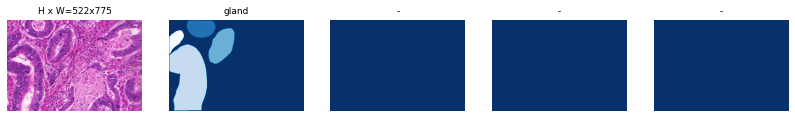

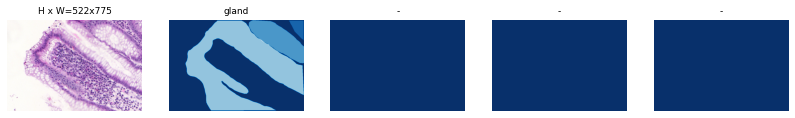

In [10]:
# Load and display random samples
image_ids = np.random.choice(dataset.image_ids, 4)
for image_id in image_ids:
    image = dataset.load_image(image_id)
    print()
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

In [16]:
# Create model in inference mode
MODEL_DIR = '/home/mkubita/Pulpit/projektBadawczy/Wyniki/Augmentation/Resnet50_56_56/gland20220507T1203/mask_rcnn_gland_0025.h5'
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                          config=config)

# Load weights
print("Loading weights ", MODEL_DIR)
model.load_weights(MODEL_DIR, by_name=True)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


2022-06-02 21:42:26.832824: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2022-06-02 21:42:26.865737: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-06-02 21:42:26.866504: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1650 computeCapability: 7.5
coreClock: 1.56GHz coreCount: 16 deviceMemorySize: 3.82GiB deviceMemoryBandwidth: 119.24GiB/s
2022-06-02 21:42:26.883022: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2022-06-02 21:42:26.886295: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10
2022-06-02 21:42:26.889127: I tensorflow/stream_executor/plat

Loading weights  /home/mkubita/Pulpit/projektBadawczy/Wyniki/Augmentation/Resnet50_56_56/gland20220507T1203/mask_rcnn_gland_0025.h5


2022-06-02 21:42:29.096385: I tensorflow/core/platform/cpu_feature_guard.cc:143] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2022-06-02 21:42:29.139108: I tensorflow/core/platform/profile_utils/cpu_utils.cc:102] CPU Frequency: 2599990000 Hz
2022-06-02 21:42:29.141518: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f955c000b60 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2022-06-02 21:42:29.141577: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2022-06-02 21:42:29.145398: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1102] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-06-02 21:42:29.145442: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1108]      


Re-starting from epoch 25


## Bounding Boxes

Rather than using bounding box coordinates provided by the source datasets, we compute the bounding boxes from masks instead. This allows us to handle bounding boxes consistently regardless of the source dataset, and it also makes it easier to resize, rotate, or crop images because we simply generate the bounding boxes from the updates masks rather than computing bounding box transformation for each type of image transformation.


*** No instances to display *** 



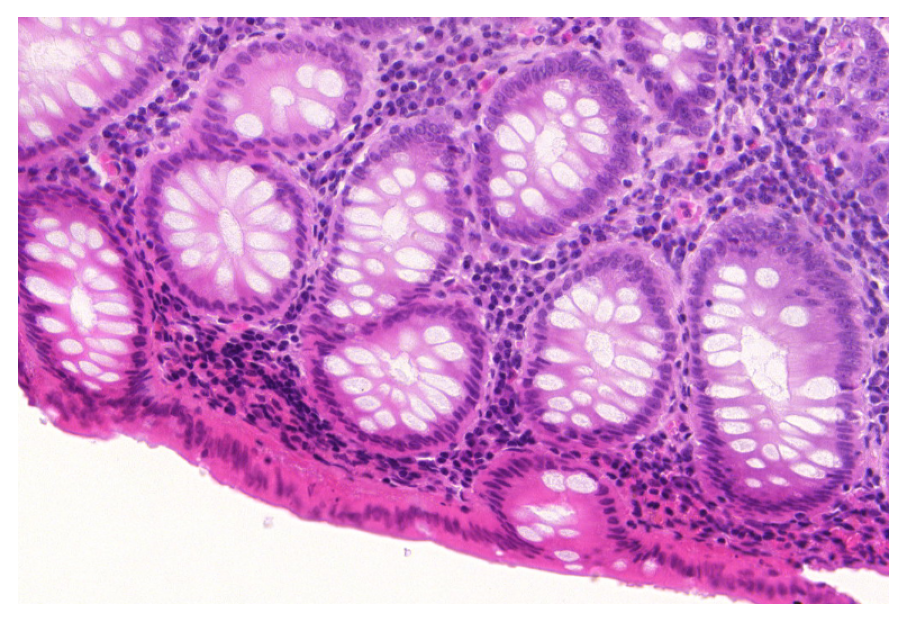

image_id  40 /home/mkubita/Pulpit/projektBadawczy/Dataset_Model/train/train_45.bmp
image                    shape: (522, 775, 3)         min:    2.00000  max:  255.00000  uint8
mask                     shape: (522, 775, 10)        min:    0.00000  max:    1.00000  bool
class_ids                shape: (10,)                 min:    1.00000  max:    1.00000  int32
bbox                     shape: (10, 4)               min:    0.00000  max:  751.00000  int32


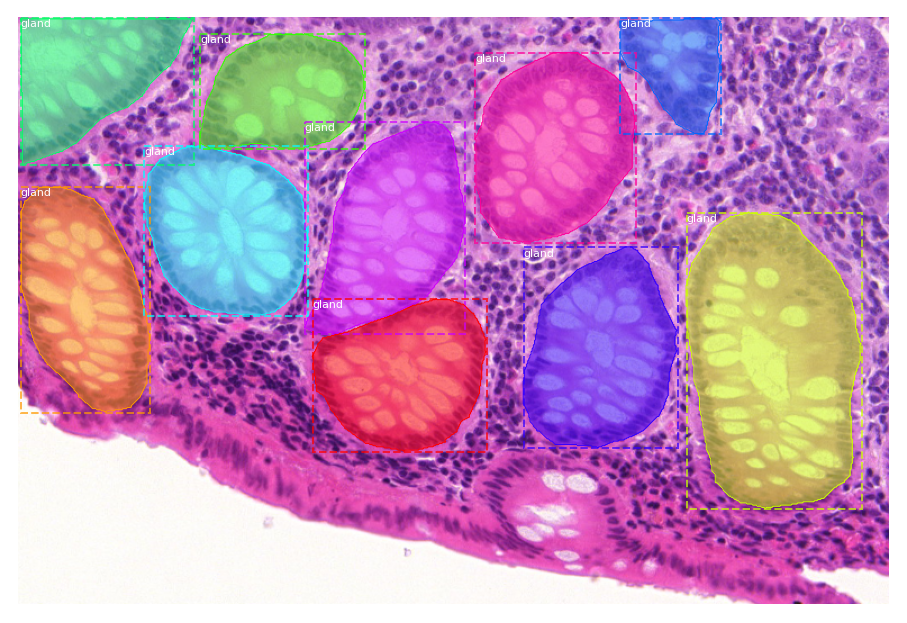


Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


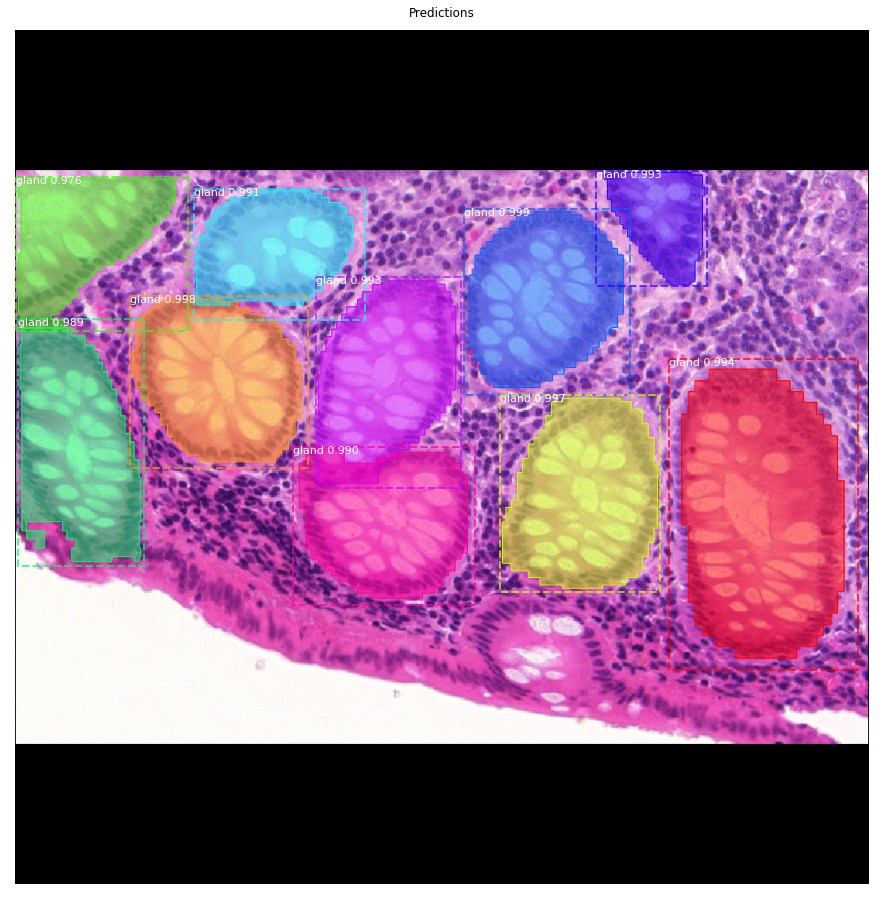

In [34]:
# Load random image and mask.
image_id = random.choice(dataset.image_ids)
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
visualize.display_instances(image, np.array([]), np.array([]), class_ids, dataset.class_names)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, dataset.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)
print()

config.USE_MINI_MASK = False
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id)

info = dataset.image_info[image_id]
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")

In [ ]:
# image_id  40 /home/mkubita/Pulpit/projektBadawczy/Dataset_Model/train/train_45.bmp


*** No instances to display *** 



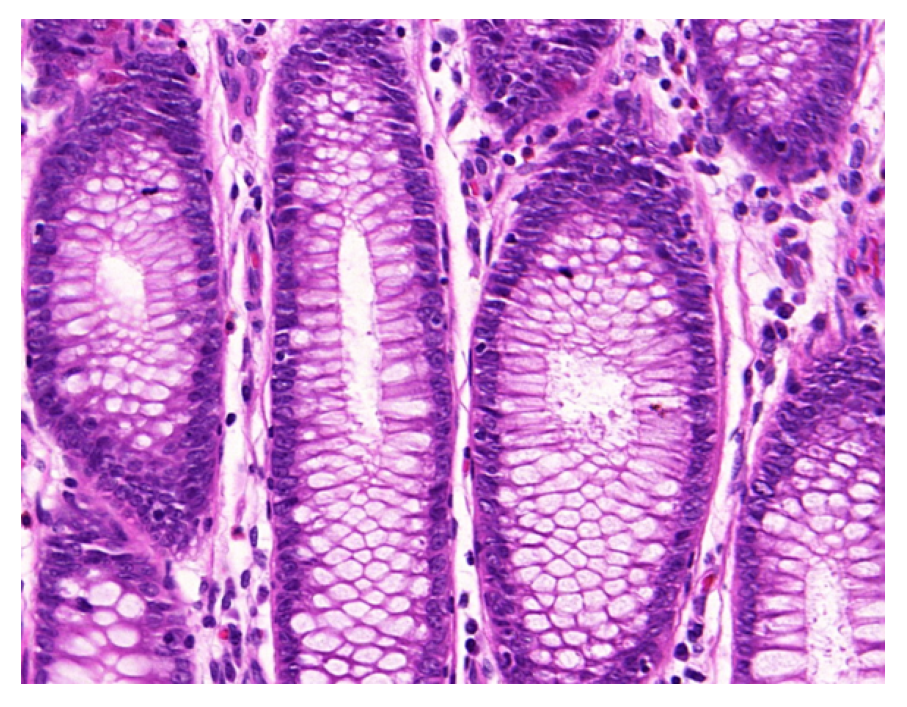

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


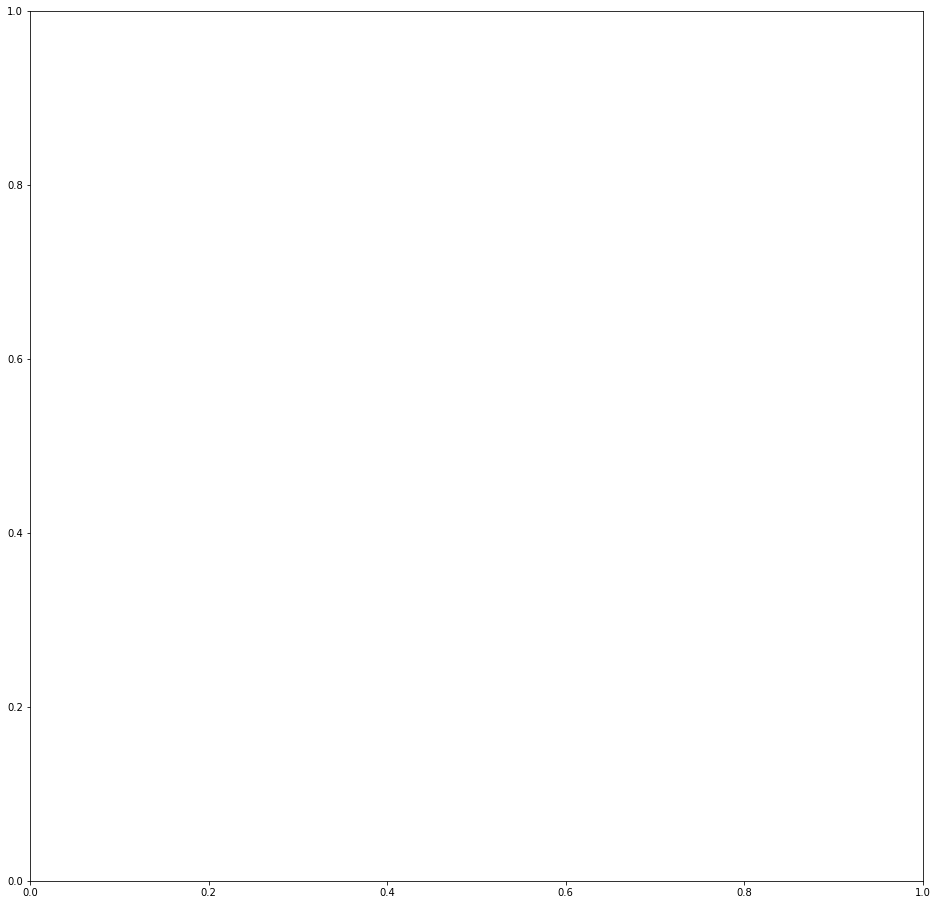

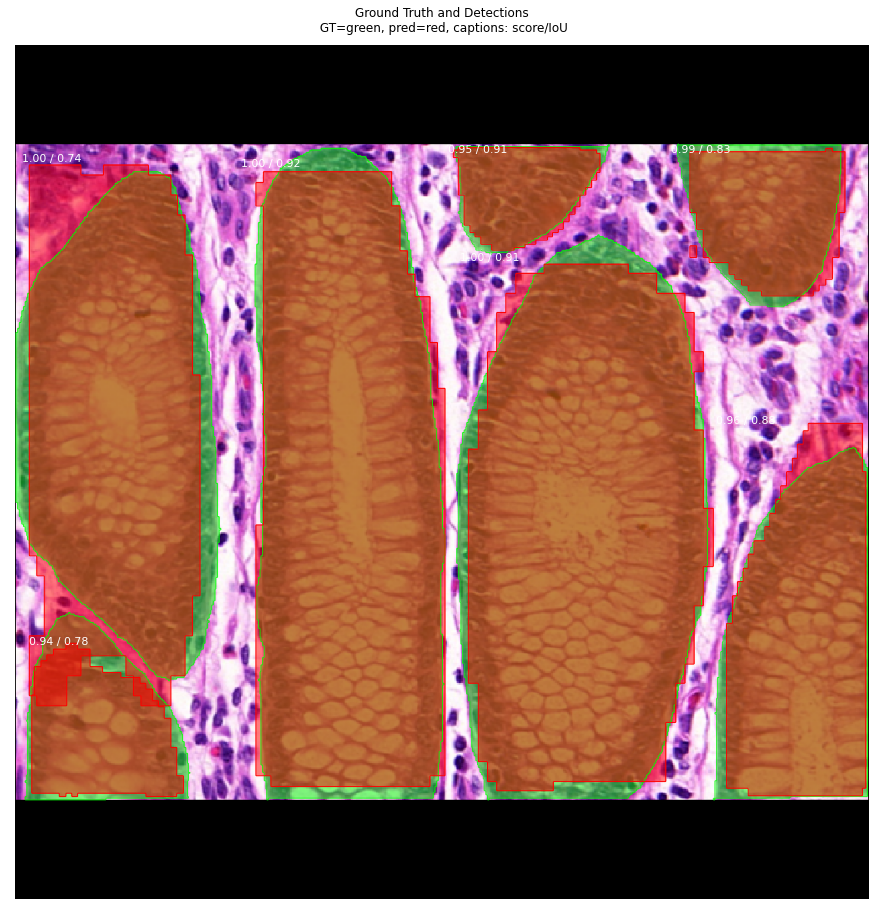

In [59]:
image_id = random.choice(dataset.image_ids)
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
visualize.display_instances(image, np.array([]), np.array([]), class_ids, dataset.class_names)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

config.USE_MINI_MASK = False
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id)

info = dataset.image_info[image_id]
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]

visualize.display_differences(image, gt_bbox, gt_class_id, gt_mask, r['rois'],r['class_ids'], 
                              r['scores'], r['masks'], dataset.class_names, show_mask=True, show_box=False)

# def display_differences(image,
#                         gt_box, gt_class_id, gt_mask,
#                         pred_box, pred_class_id, pred_score, pred_mask,
#                         class_names, title="", ax=None,
#                         show_mask=True, show_box=True,
#                         iou_threshold=0.5, score_threshold=0.5):
    
#     visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
#                             dataset.class_names, r['scores'], ax=ax,
#                             title="Predictions")

## Resize Images

To support multiple images per batch, images are resized to one size (1024x1024). Aspect ratio is preserved, though. If an image is not square, then zero padding is added at the top/bottom or right/left.

image_id:  4 /home/mkubita/Pulpit/projektBadawczy/Dataset_Model/train/train_5.bmp
Original shape:  (522, 775, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 8)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (8,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (8, 4)                min:    0.00000  max: 1024.00000  int32


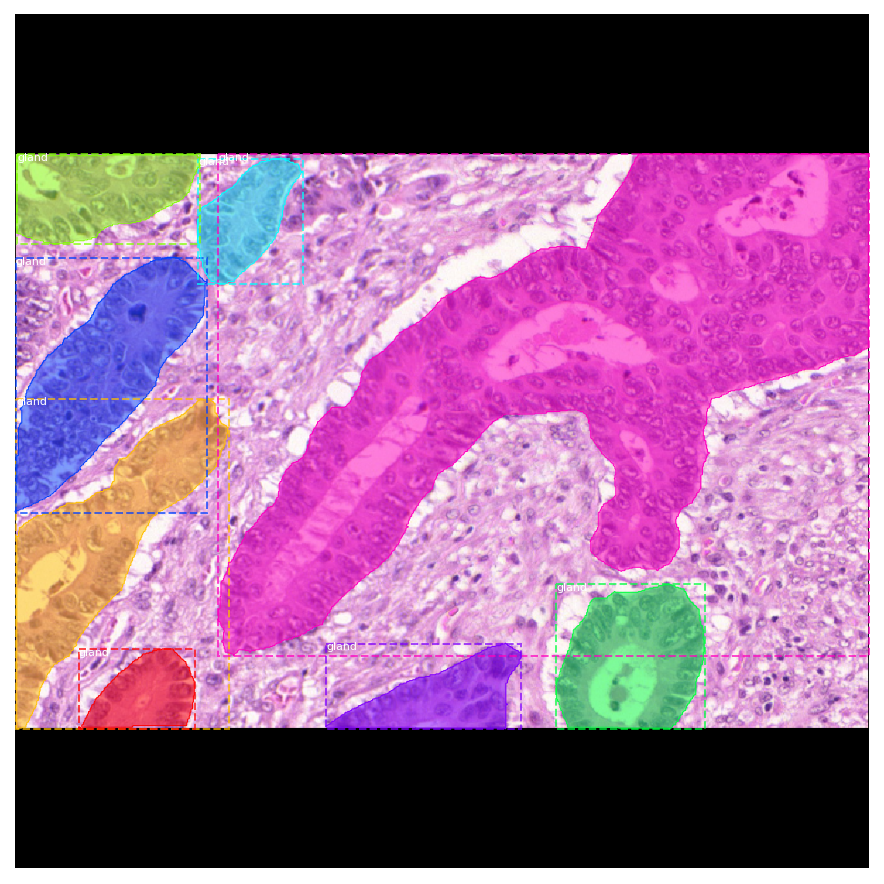

In [8]:
# Load random image and mask.
image_id = np.random.choice(dataset.image_ids, 1)[0]
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
original_shape = image.shape
# Resize
image, window, scale, padding, _ = utils.resize_image(
    image, 
    min_dim=config.IMAGE_MIN_DIM, 
    max_dim=config.IMAGE_MAX_DIM,
    mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id: ", image_id, dataset.image_reference(image_id))
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

## Mini Masks

Instance binary masks can get large when training with high resolution images. For example, if training with 1024x1024 image then the mask of a single instance requires 1MB of memory (Numpy uses bytes for boolean values). If an image has 100 instances then that's 100MB for the masks alone. 

To improve training speed, we optimize masks by:
* We store mask pixels that are inside the object bounding box, rather than a mask of the full image. Most objects are small compared to the image size, so we save space by not storing a lot of zeros around the object.
* We resize the mask to a smaller size (e.g. 56x56). For objects that are larger than the selected size we lose a bit of accuracy. But most object annotations are not very accuracy to begin with, so this loss is negligable for most practical purposes. Thie size of the mini_mask can be set in the config class.

To visualize the effect of mask resizing, and to verify the code correctness, we visualize some examples.

image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max: 1024.00000  float64
class_ids                shape: (5,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (5, 4)                min:    0.00000  max: 1024.00000  int32
mask                     shape: (56, 56, 5)           min:    0.00000  max:    1.00000  bool


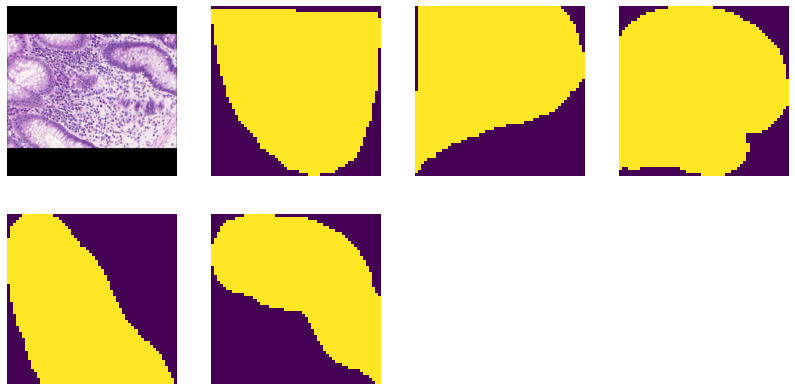

In [9]:
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

In [10]:
# visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

mask                     shape: (56, 56, 5)           min:    0.00000  max:    1.00000  bool


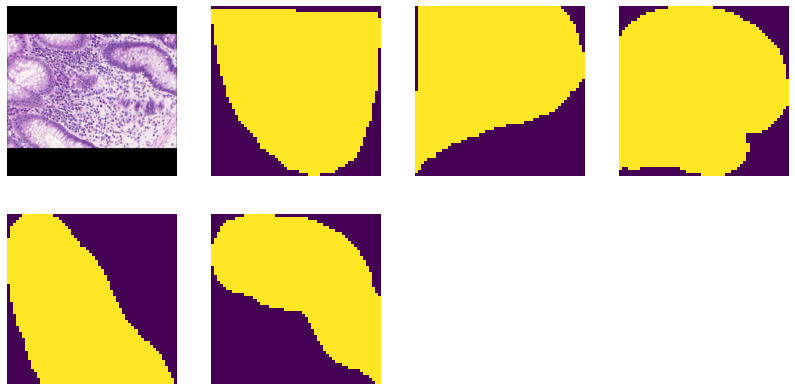

In [11]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

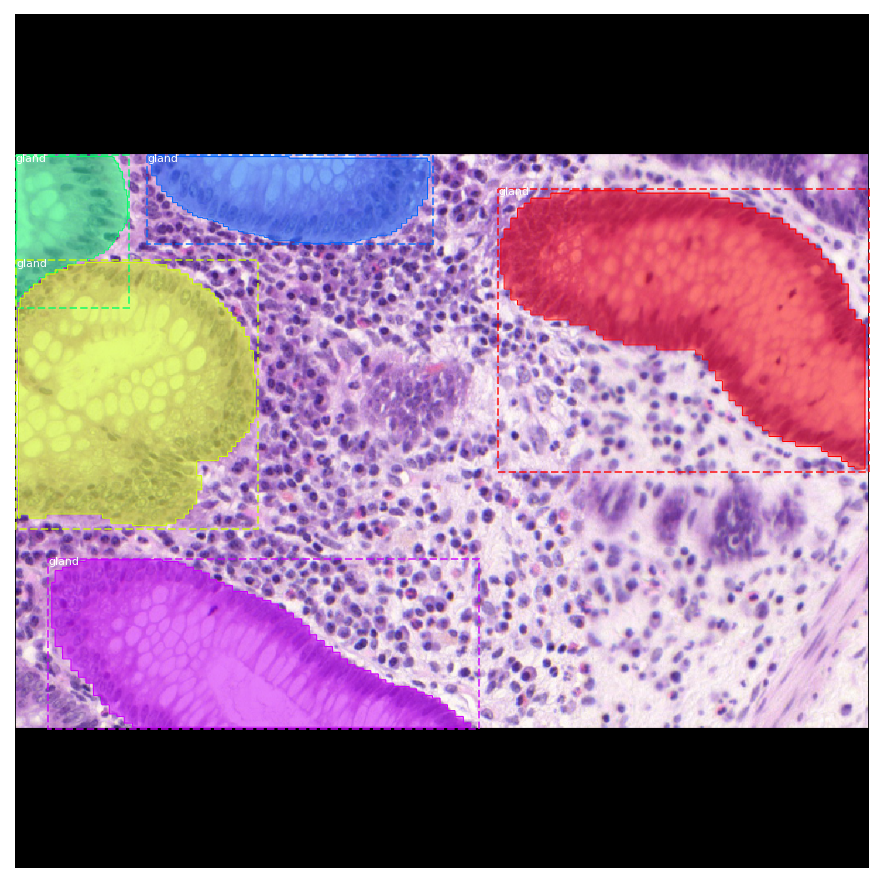

In [12]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

## Anchors

The order of anchors is important. Use the same order in training and prediction phases. And it must match the order of the convolution execution.

For an FPN network, the anchors must be ordered in a way that makes it easy to match anchors to the output of the convolution layers that predict anchor scores and shifts. 

* Sort by pyramid level first. All anchors of the first level, then all of the second and so on. This makes it easier to separate anchors by level.
* Within each level, sort anchors by feature map processing sequence. Typically, a convolution layer processes a feature map starting from top-left and moving right row by row. 
* For each feature map cell, pick any sorting order for the anchors of different ratios. Here we match the order of ratios passed to the function.

**Anchor Stride:**
In the FPN architecture, feature maps at the first few layers are high resolution. For example, if the input image is 1024x1024 then the feature meap of the first layer is 256x256, which generates about 200K anchors (256*256*3). These anchors are 32x32 pixels and their stride relative to image pixels is 4 pixels, so there is a lot of overlap. We can reduce the load significantly if we generate anchors for every other cell in the feature map. A stride of 2 will cut the number of anchors by 4, for example. 

In this implementation we use an anchor stride of 2, which is different from the paper.

In [13]:
# Generate Anchors
backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

Count:  1305600
Scales:  (96, 256, 384, 384, 256)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 27648
Anchors in Level 1: 196608
Anchors in Level 2: 442368
Anchors in Level 3: 442368
Anchors in Level 4: 196608


Visualize anchors of one cell at the center of the feature map of a specific level.

Level 0. Anchors:  27648  Feature map Shape: [96 96]
Level 1. Anchors: 196608  Feature map Shape: [256 256]
Level 2. Anchors: 442368  Feature map Shape: [384 384]
Level 3. Anchors: 442368  Feature map Shape: [384 384]
Level 4. Anchors: 196608  Feature map Shape: [256 256]


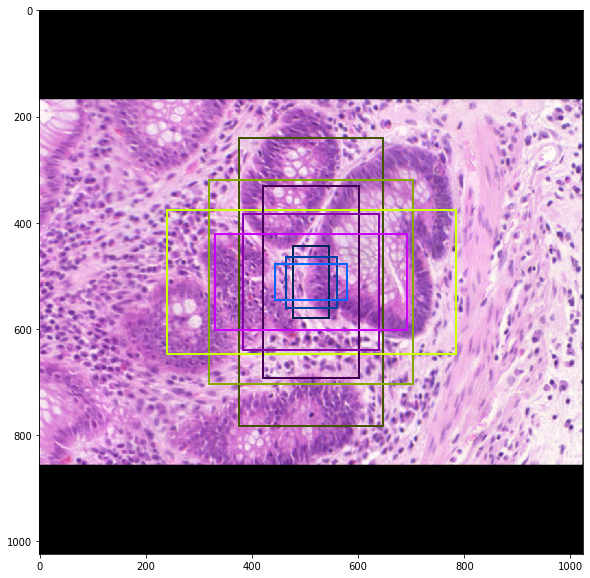

In [14]:
## Visualize anchors of one cell at the center of the feature map of a specific level

# Load and draw random image
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, _, _, _ = modellib.load_image_gt(dataset, config, image_id)
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
levels = len(backbone_shapes)

for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level]) # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, level_anchors.shape[0], 
                                                                  backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])
    level_center = center_cell_index * anchors_per_cell 
    center_anchor = anchors_per_cell * (
        (center_cell[0] * backbone_shapes[level][1] / config.RPN_ANCHOR_STRIDE**2) \
        + center_cell[1] / config.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)


## Data Generator


In [15]:
# Create data generator
random_rois = 2000
g = modellib.DataGenerator(
    dataset, config, shuffle=True, random_rois=random_rois,
    detection_targets=True)

In [16]:
# Uncomment to run the generator through a lot of images
# to catch rare errors
for i in range(1000):
    print(i)
    _, _ = next(g)

0


TypeError: 'DataGenerator' object is not an iterator

In [19]:
# Get Next Image
if random_rois:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], \
    [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] = g[0]
    
    log("rois", rois)
    log("mrcnn_class_ids", mrcnn_class_ids)
    log("mrcnn_bbox", mrcnn_bbox)
    log("mrcnn_mask", mrcnn_mask)
else:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = g[0]
    
log("gt_class_ids", gt_class_ids)
log("gt_boxes", gt_boxes)
log("gt_masks", gt_masks)
log("rpn_match", rpn_match, )
log("rpn_bbox", rpn_bbox)
image_id = modellib.parse_image_meta(image_meta)["image_id"][0]
print("image_id: ", image_id, dataset.image_reference(image_id))

# Remove the last dim in mrcnn_class_ids. It's only added
# to satisfy Keras restriction on target shape.
mrcnn_class_ids = mrcnn_class_ids[:,:,0]

rois                     shape: (1, 200, 4)           min:    1.00000  max: 1023.00000  int32
mrcnn_class_ids          shape: (1, 200, 1)           min:    0.00000  max:    1.00000  int32
mrcnn_bbox               shape: (1, 200, 2, 4)        min:   -3.98230  max:    2.71186  float32
mrcnn_mask               shape: (1, 200, 28, 28, 2)   min:    0.00000  max:    1.00000  float32
gt_class_ids             shape: (1, 100)              min:    0.00000  max:    1.00000  int32
gt_boxes                 shape: (1, 100, 4)           min:    0.00000  max: 1022.00000  int32
gt_masks                 shape: (1, 56, 56, 100)      min:    0.00000  max:    1.00000  bool
rpn_match                shape: (1, 1305600, 1)       min:   -1.00000  max:    1.00000  int32
rpn_bbox                 shape: (1, 256, 4)           min:   -3.69230  max:    2.80674  float64
image_id:  8 /home/mkubita/Pulpit/projektBadawczy/Dataset_Model/train/train_9.bmp


anchors                  shape: (1305600, 4)          min: -271.52900  max: 1292.86234  float64
refined_anchors          shape: (128, 4)              min:    2.00000  max: 1022.00000  float32
Positive anchors: 128
Negative anchors: 128
Neutral anchors: 1305344
BG                     : 157
gland                  : 43


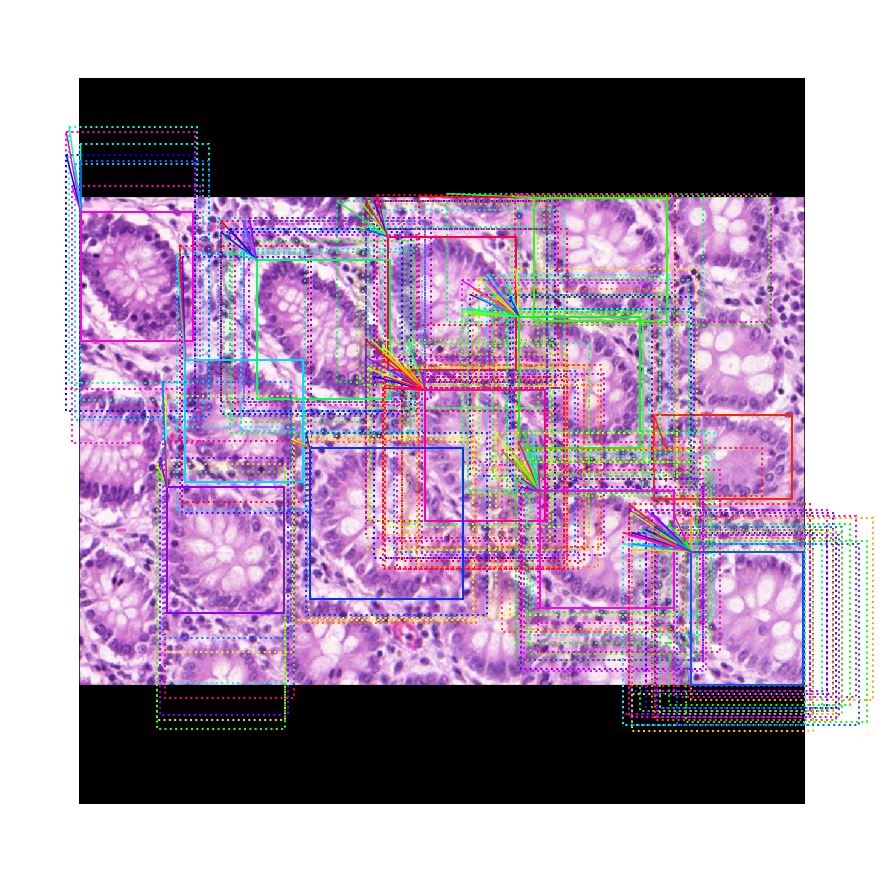

In [20]:
b = 0

# Restore original image (reverse normalization)
sample_image = modellib.unmold_image(normalized_images[b], config)

# Compute anchor shifts.
indices = np.where(rpn_match[b] == 1)[0]
refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * config.RPN_BBOX_STD_DEV)
log("anchors", anchors)
log("refined_anchors", refined_anchors)

# Get list of positive anchors
positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
print("Positive anchors: {}".format(len(positive_anchor_ids)))
negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
print("Negative anchors: {}".format(len(negative_anchor_ids)))
neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
print("Neutral anchors: {}".format(len(neutral_anchor_ids)))

# ROI breakdown by class
for c, n in zip(dataset.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
    if n:
        print("{:23}: {}".format(c[:20], n))

# Show positive anchors
fig, ax = plt.subplots(1, figsize=(16, 16))
visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], 
                     refined_boxes=refined_anchors, ax=ax)

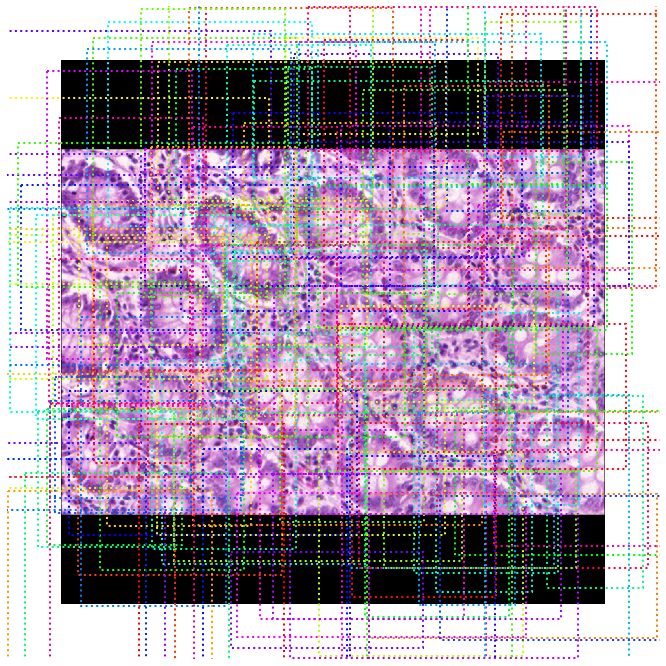

In [21]:
# Show negative anchors
visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])

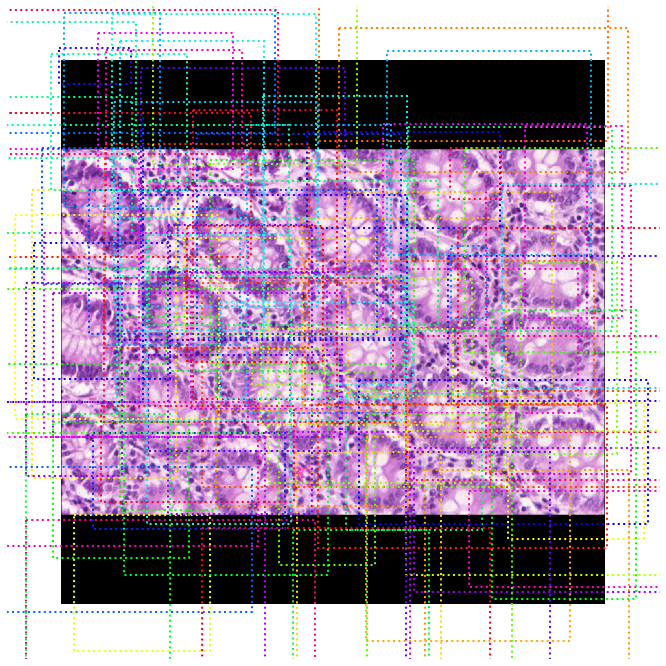

In [22]:
# Show neutral anchors. They don't contribute to training.
visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])

## ROIs

Positive ROIs:  43
Negative ROIs:  157
Positive Ratio: 0.21
Unique ROIs: 200 out of 200


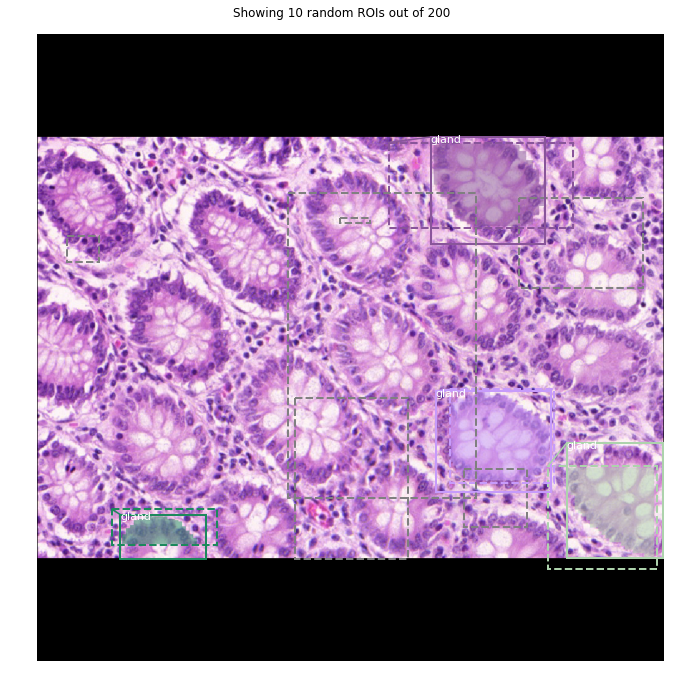

In [23]:
if random_rois:
    # Class aware bboxes
    bbox_specific = mrcnn_bbox[b, np.arange(mrcnn_bbox.shape[1]), mrcnn_class_ids[b], :]

    # Refined ROIs
    refined_rois = utils.apply_box_deltas(rois[b].astype(np.float32), bbox_specific[:,:4] * config.BBOX_STD_DEV)

    # Class aware masks
    mask_specific = mrcnn_mask[b, np.arange(mrcnn_mask.shape[1]), :, :, mrcnn_class_ids[b]]

    visualize.draw_rois(sample_image, rois[b], refined_rois, mask_specific, mrcnn_class_ids[b], dataset.class_names)
    
    # Any repeated ROIs?
    rows = np.ascontiguousarray(rois[b]).view(np.dtype((np.void, rois.dtype.itemsize * rois.shape[-1])))
    _, idx = np.unique(rows, return_index=True)
    print("Unique ROIs: {} out of {}".format(len(idx), rois.shape[1]))

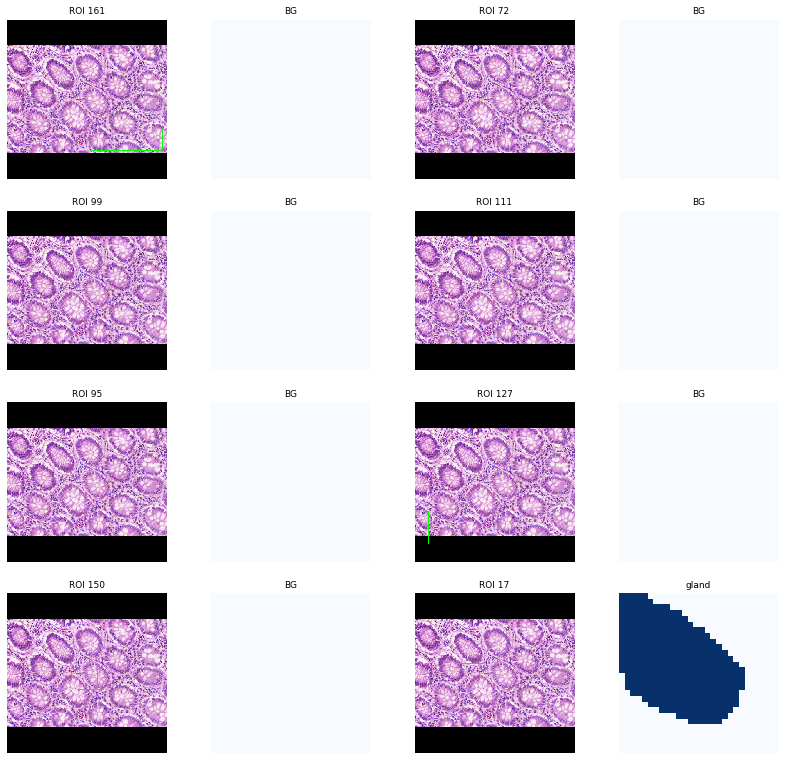

In [24]:
if random_rois:
    # Dispalay ROIs and corresponding masks and bounding boxes
    ids = random.sample(range(rois.shape[1]), 8)

    images = []
    titles = []
    for i in ids:
        image = visualize.draw_box(sample_image.copy(), rois[b,i,:4].astype(np.int32), [255, 0, 0])
        image = visualize.draw_box(image, refined_rois[i].astype(np.int64), [0, 255, 0])
        images.append(image)
        titles.append("ROI {}".format(i))
        images.append(mask_specific[i] * 255)
        titles.append(dataset.class_names[mrcnn_class_ids[b,i]][:20])

    display_images(images, titles, cols=4, cmap="Blues", interpolation="none")

In [25]:
# Check ratio of positive ROIs in a set of images.
if random_rois:
    limit = 10
    temp_g = modellib.DataGenerator(
        dataset, config, shuffle=True, random_rois=10000, 
        detection_targets=True)
    total = 0
    for i in range(limit):
        _, [ids, _, _] = temp_g[i]
        positive_rois = np.sum(ids[0] > 0)
        total += positive_rois
        print("{:5} {:5.2f}".format(positive_rois, positive_rois/ids.shape[1]))
    print("Average percent: {:.2f}".format(total/(limit*ids.shape[1])))

   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
Average percent: 0.33
